# Construire un réseau de convolutions (CNN) pour tester trois classes

## Description
Ce notebook entraîne un CNN pour une tâche de **classification à 3 classes** : mouton, chat et éléphant. Il explore successivement plusieurs stratégies d'amélioration face au surapprentissage : réglage du modèle (régularisation L2, dropout), augmentation de données via `ImageDataGenerator`, et **transfer learning** avec ResNet50.


In [18]:
import os
from os import listdir
from os.path import isfile, join
import numpy as np
import pandas as pd
import random
import zipfile

import matplotlib.pyplot as plt
import seaborn as sns
import cv2

from sklearn.datasets import make_moons
from sklearn.datasets import make_circles
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline

import joblib

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Input, Model, regularizers
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.regularizers import l2
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Générateur d'images pour l'augmentation des données
from tensorflow.keras.applications.resnet50 import ResNet50 , preprocess_input

# Pour définir la graine tout de suite
np.random.seed(42)
tf.random.set_seed(42)

print(tf.__version__)

2.18.0


In [2]:
# Cellule générée par ChatGPT

def plot_history_simple(history):
    """
    Trace côte à côte les courbes Loss et Accuracy (train/val si dispo)
    à partir d'un objet Keras History.
    """
    hist = history.history

    # compatibilité anciennes versions ("acc"/"val_acc")
    acc_key = "accuracy" if "accuracy" in hist else "acc"
    val_acc_key = "val_accuracy" if "val_accuracy" in hist else "val_acc"

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # --- Loss ---
    if "loss" in hist:
        axes[0].plot(hist["loss"], label="train")
    if "val_loss" in hist:
        axes[0].plot(hist["val_loss"], label="val")
    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()

    # --- Accuracy ---
    if acc_key in hist:
        axes[1].plot(hist[acc_key], label="train")
        if val_acc_key in hist:
            axes[1].plot(hist[val_acc_key], label="val")
        axes[1].set_title("Accuracy")
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("Accuracy")
        axes[1].legend()
    else:
        axes[1].set_visible(False)  # si pas d'accuracy, on masque le 2e plot

    plt.tight_layout()
    plt.show()



def plot_confusion_matrix_simple(y_true, y_pred, labels=(0,1),
                                 normalize=None, title="Confusion matrix"):
    """
    Affiche une matrice de confusion.
    Args:
        y_true, y_pred : vecteurs de labels
        labels         : ordre des classes à afficher
        normalize      : None, 'true', 'pred', ou 'all' (comme scikit-learn)
        title          : titre de la figure
    """
    cm = confusion_matrix(y_true, y_pred, labels=labels, normalize=normalize)
    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    im = ax.imshow(cm, interpolation='nearest')
    ax.figure.colorbar(im, ax=ax)

    ax.set(
        xticks=np.arange(len(labels)),
        yticks=np.arange(len(labels)),
        xticklabels=labels,
        yticklabels=labels,
        xlabel="Predicted label",
        ylabel="True label",
      title=title if normalize is None else f"{title} (normalized: {normalize})"
    )

    # annotations
    thresh = cm.max() / 2.0 if cm.size else 0.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            txt = f"{cm[i, j]:.2f}" if normalize else f"{int(cm[i, j])}"
            ax.text(j, i, txt,
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.show()

def plot_history_cv_mean_std(all_histories, alpha=0.2):
    """
    all_histories : list[pd.DataFrame]
        Chaque DF doit contenir : ['accuracy','loss','val_accuracy','val_loss','epoch','fold'].
        (c'est exactement ton format actuel)

    Trace loss et accuracy (train/val) avec moyenne ± écart-type par epoch.
    Si certains folds s'arrêtent plus tôt (early stopping), la moyenne/STD
    sur les dernières époques est calculée sur les folds encore présents.
    """
    import pandas as pd
    import matplotlib.pyplot as plt

    # 1) Concat & agrégation
    df = pd.concat(all_histories, ignore_index=True)
    cols = [c for c in ["loss", "val_loss", "accuracy", "val_accuracy"] if c in df.columns]
    stats = df.groupby("epoch")[cols].agg(["mean", "std"])
    stats.columns = [f"{m}_{s}" for m, s in stats.columns]  # ex: ('loss','mean')->'loss_mean'
    stats = stats.reset_index()
    epochs = stats["epoch"].values

    # 2) Plot côte à côte
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # --- Loss ---
    if "loss_mean" in stats:
        axes[0].plot(epochs, stats["loss_mean"], label="train")
        if "loss_std" in stats:
            axes[0].fill_between(epochs, stats["loss_mean"]-stats["loss_std"],
                                          stats["loss_mean"]+stats["loss_std"], alpha=alpha)
    if "val_loss_mean" in stats:
        axes[0].plot(epochs, stats["val_loss_mean"], label="val")
        if "val_loss_std" in stats:
            axes[0].fill_between(epochs, stats["val_loss_mean"]-stats["val_loss_std"],
                                          stats["val_loss_mean"]+stats["val_loss_std"], alpha=alpha)
    axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss"); axes[0].legend()

    # --- Accuracy ---
    if "accuracy_mean" in stats:
        axes[1].plot(epochs, stats["accuracy_mean"], label="train")
        if "accuracy_std" in stats:
            axes[1].fill_between(epochs, stats["accuracy_mean"]-stats["accuracy_std"],
                                          stats["accuracy_mean"]+stats["accuracy_std"], alpha=alpha)
    if "val_accuracy_mean" in stats:
        axes[1].plot(epochs, stats["val_accuracy_mean"], label="val")
        if "val_accuracy_std" in stats:
            axes[1].fill_between(epochs, stats["val_accuracy_mean"]-stats["val_accuracy_std"],
                                          stats["val_accuracy_mean"]+stats["val_accuracy_std"], alpha=alpha)
    axes[1].set_title("Accuracy"); axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Accuracy"); axes[1].legend()

    plt.tight_layout()
    plt.show()

def plot_decision_boundary(pipe, X, y=None, title=None, h=0.02, padding=0.5, threshold=0.5, ax=None):
    """
    Affiche la frontière de décision d'un modèle 2D (ex: make_moons).
    pipe : Pipeline déjà fit (ex: StandardScaler + KerasClassifier)
    X, y : données à superposer (y optionnel pour juste la frontière)
    h : pas de la grille, padding : marge autour des données
    threshold : seuil de classification si proba disponible
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,5))

    # -- Grille 2D
    x_min, x_max = X[:,0].min()-padding, X[:,0].max()+padding
    y_min, y_max = X[:,1].min()-padding, X[:,1].max()+padding
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    grid = np.c_[xx.ravel(), yy.ravel()]

    # -- Prédiction robuste (proba > decision_function > predict)
    Z = None
    if hasattr(pipe, "predict_proba"):
        proba = pipe.predict_proba(grid)
        # binaire : colonnes [p(classe0), p(classe1)] ou vecteur
        Z = proba[:,1] if proba.ndim == 2 and proba.shape[1] > 1 else proba.ravel()
    elif hasattr(pipe, "decision_function"):
        s = pipe.decision_function(grid).ravel()
        # Normalisation sigmoïde légère sans SciPy
        Z = 1 / (1 + np.exp(-s))
    else:
        # chute de secours : classes {0,1}
        Z = pipe.predict(grid).ravel().astype(float)

    Z_grid = Z.reshape(xx.shape)

    # -- Fond coloré + ligne de frontière
    # si Z est proba, on trace la courbe de niveau au seuil; sinon on sépare 0/1
    if np.unique(Z).size > 2 or (Z.min() >= 0 and Z.max() <= 1):
        ax.contourf(xx, yy, Z_grid, levels=50, alpha=0.25)
        ax.contour(xx, yy, (Z_grid >= threshold).astype(int), levels=[0.5], colors="k", linewidths=1)
    else:
        ax.contourf(xx, yy, Z_grid, levels=[-0.5,0.5,1.5], alpha=0.25)
        ax.contour(xx, yy, Z_grid, levels=[0.5], colors="k", linewidths=1)

    # -- Nuage de points (si y fourni)
    if y is not None:
        ax.scatter(X[:,0], X[:,1], c=y, s=25, edgecolor="k", linewidth=0.5)

    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    if title:
        ax.set_title(title)
    ax.set_aspect("equal", adjustable="box")
    plt.tight_layout()
    return ax

def plot_examples(X,y,nb_columns=25):
  plt.figure(figsize=(15,15))
  for i in range(nb_columns):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    img_rgb = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))

In [4]:
zip_files=["Data_sheep_cat_elephant_with_caption_200.zip",
    "Data_sheep_cat_elephant_with_caption_400.zip",
    "Data_sheep_cat_elephant_with_caption_600.zip"]

for file in zip_files:
    !wget https://www.lirmm.fr/~poncelet/Ressources/{file}
    
    with zipfile.ZipFile(file, "r") as zip_ref:
        zip_ref.extractall("Data_Project")

    os.remove(file)

--2026-04-05 21:54:50--  https://www.lirmm.fr/~poncelet/Ressources/Data_sheep_cat_elephant_with_caption_200.zip
Résolution de www.lirmm.fr (www.lirmm.fr)… 193.49.104.251
Connexion à www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 115482858 (110M) [application/zip]
Enregistre : ‘Data_sheep_cat_elephant_with_caption_200.zip’

eep_cat_elephant_wi   9%[>                   ]  10,15M  2,55MB/s    tps 35s    ^C


BadZipFile: File is not a zip file

# Resize images

In [6]:
IMG_SIZE=128
mypaths=['Data_Project/images/elephant', 'Data_Project/images/cat', 'Data_Project/images/sheep']

for path in mypaths:
    onlyfiles = [ f for f in listdir(path) if isfile(join(path,f)) ]
    images = np.empty(len(onlyfiles), dtype=object)
    for n in range(0, len(onlyfiles)):
        images[n] = cv2.imread( join(path,onlyfiles[n]) )
        images[n]  = cv2.resize(images[n], (IMG_SIZE, IMG_SIZE))

In [7]:
#there is a slight modification from the code we copied 
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
      path=os.path.join(path_data, classes)
      class_num=list_classes.index(classes)
      for img in os.listdir(path):
        try:
          img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_COLOR) #we can read colors now forcing 3 channels
          new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
          training_data.append([new_array, class_num])
        except Exception as e:
          pass
  return training_data

def create_X_y (path_data, list_classes):
      # récupération des données
      training_data=create_training_data(path_data, list_classes)
      # tri des données
      random.shuffle(training_data)
      # création de X et y
      X=[]
      y=[]
      for features, label in training_data:
        X.append(features)
        y.append(label)
      X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
      y=np.array(y)
      return X,y

# Loading the classes

Nombre de données : 1800
Taille d'une image : (128, 128, 3)
Distribution des classes :
2    600
1    600
0    600
Name: count, dtype: int64


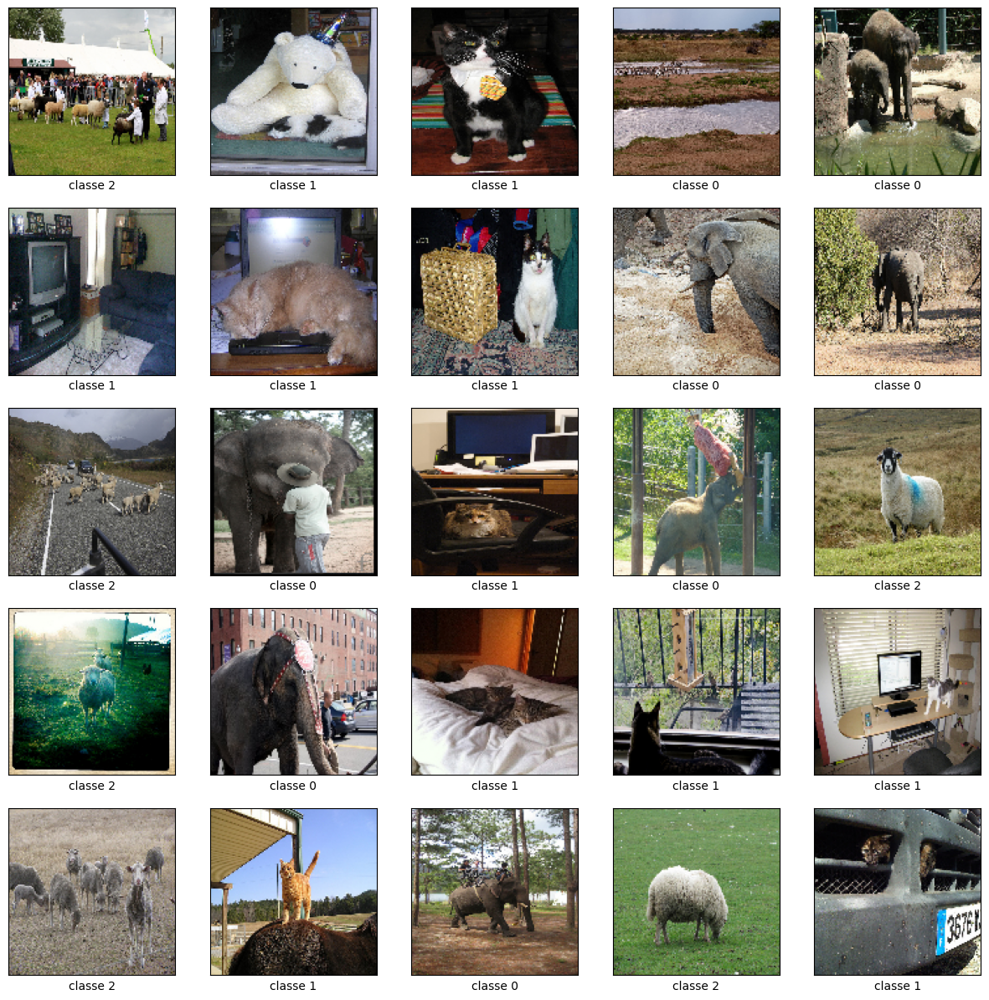

In [41]:
my_path = "Data_Project/images/"          
my_classes = ['elephant', 'cat', 'sheep']  

X, y = create_X_y(my_path, my_classes)

plot_examples(X, y)

print("Nombre de données :", X.shape[0])
print("Taille d'une image :", X[0].shape)
print("Distribution des classes :")
print(pd.Series(y).value_counts())

# Normalize data 

In [42]:
X=X.astype('float')
X=X/255.0

# Building the CNN model

In [8]:
image_size=128


input = Input(shape=(image_size, image_size, 3), name="Input_layer")
x = Conv2D(32, (3, 3), activation="relu", name="Conv2D_1")(input)
x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_1")(x)
x = Flatten(name="Flatten")(x)
x = Dense(64, activation="relu", name="dense_1")(x)

output = Dense(3, activation="softmax", name="Output_Layer")(x)

model = Model(inputs=input, outputs=output, name="Baseline_CNN")

W0000 00:00:1775401944.691248   27213 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


# Compiling the Model

In [9]:
model.compile(optimizer=Adam(1e-3),
              loss="sparse_categorical_crossentropy", #categoral entropy doesn't work, forgot i needed the data to be encoded :(
              metrics=["accuracy"])

In [10]:
model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPool2D_1 (MaxPooling2D)      │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 127008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │     8,128,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer (Dense)            │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,129,667 (31.01 MB)

 Trainable params: 8,129,667 (31.01 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.4557 - loss: 2.3658 - val_accuracy: 0.6597 - val_loss: 0.8895
Epoch 2/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.6918 - loss: 0.7743 - val_accuracy: 0.6458 - val_loss: 0.8537
Epoch 3/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8038 - loss: 0.5655 - val_accuracy: 0.6736 - val_loss: 0.8367
Epoch 4/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8941 - loss: 0.3724 - val_accuracy: 0.6493 - val_loss: 0.8698
Epoch 5/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.9089 - loss: 0.3050 - val_accuracy: 0.6250 - val_loss: 0.8652
Epoch 6/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.9288 - loss: 0.2637 - val_accuracy: 0.5729 - val_loss: 1.1386
Epoch 7/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.9705 - loss: 0.1697 - val_accuracy: 0.6215 - val_loss: 1.1461
Epoch 8/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.9939 - loss: 0.0879 - val_accuracy: 0.6146 - v

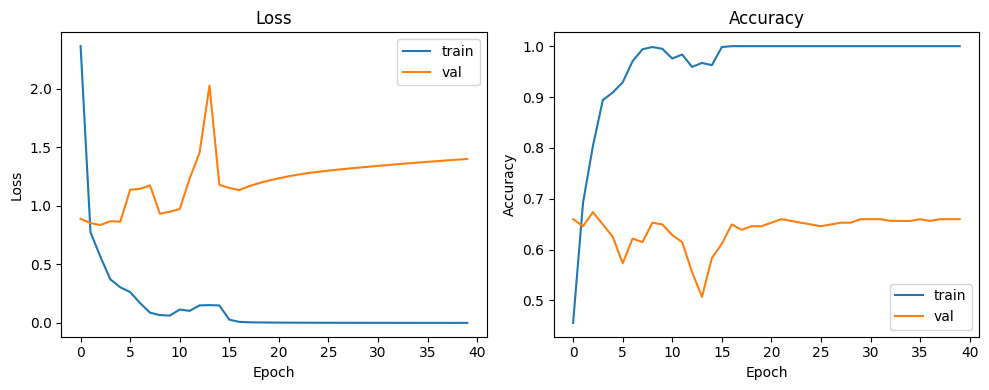

Test accuracy: 0.658


In [11]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Entraînement
epochs = 40
batch_size = 32
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    verbose=1
)

# Courbes loss/accuracy
plot_history_simple(history)

# Évaluation sur X_test
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
print("Test accuracy:", round(test_acc, 3))

# Conclusion
Le model montre des signes de overfitting, la courbe de la fonction de perte pour l'entraînement continue de baîsser tandis que
celle pour le jeu de test cesse de diminuer autour l'epoch 4. et pour la courbe de l'accuracy on observe pour celle de jeu de test
qu'elle n'augmante après l'epoch 10.

## Solution :
###            1) Réglage du modèle (ajout de dropout,...ect)
###            2) Augmentation de Données
###            3)Transfer learning

# Réglage du modèle 

### 1er essai

In [12]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import SGD 
image_size=128


input = Input(shape=(image_size, image_size, 3), name="Input_layer")
x = Conv2D(32, (3, 3), activation="relu", padding="same", name="Conv2D_1")(input)
x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_1")(x)
x = Conv2D(64, (3, 3), activation="relu", padding="same", name="Conv2D_2")(x)
x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_2")(x)
x = Flatten(name="Flatten")(x)
x = Dense(64, activation="relu", kernel_regularizer=regularizers.l2(0.01), name="dense_1")(x)
x = Dropout(0.5)(x)

output = Dense(3, activation="softmax", name="Output_Layer")(x)

model = Model(inputs=input, outputs=output, name="Deeper_CNN")

In [13]:
opt = SGD(learning_rate=0.01, momentum=0.9)
model.compile(optimizer=opt,
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [14]:
model.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPool2D_1 (MaxPooling2D)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPool2D_2 (MaxPooling2D)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │     4,194,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer (Dense)            │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,213,955 (16.07 MB)

 Trainable params: 4,213,955 (16.07 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.3490 - loss: 2.3799 - val_accuracy: 0.3715 - val_loss: 2.2686
Epoch 2/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - accuracy: 0.3767 - loss: 2.1969 - val_accuracy: 0.4132 - val_loss: 2.1029
Epoch 3/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - accuracy: 0.4062 - loss: 2.0356 - val_accuracy: 0.3576 - val_loss: 1.9684
Epoch 4/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step - accuracy: 0.3785 - loss: 1.9075 - val_accuracy: 0.4549 - val_loss: 1.8356
Epoch 5/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.4262 - loss: 1.7784 - val_accuracy: 0.4201 - val_loss: 1.7119
Epoch 6/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - accuracy: 0.4366 - loss: 1.6762 - val_accuracy: 0.4896 - val_loss: 1.6175
Epoch 7/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - accuracy: 0.4514 - loss: 1.5827 - val_accuracy: 0.5417 - val_loss: 1.4688
Epoch 8/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - accuracy: 0.5026 - loss: 1.4613 - val_accuracy: 0.

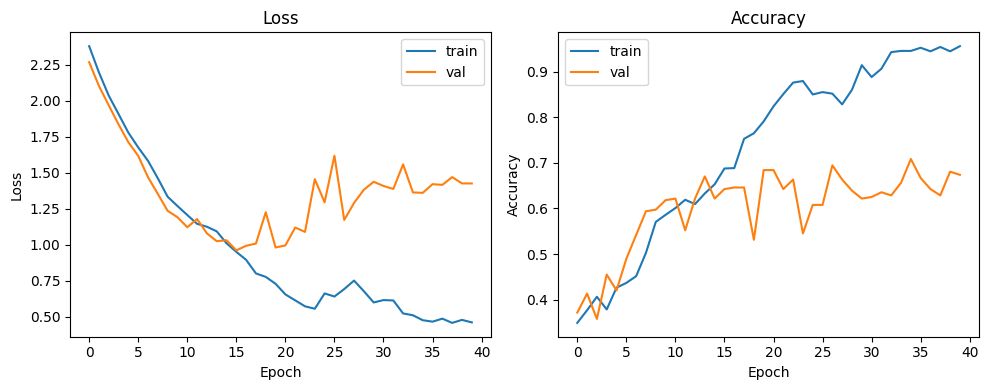

Test accuracy: 0.703


In [61]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Entraînement
epochs = 40
batch_size = 32
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    verbose=1
)

# Courbes loss/accuracy
plot_history_simple(history)

# Évaluation sur X_test
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
print("Test accuracy:", round(test_acc, 3))

# Conclusion

le modèle prouve d'être mieux que le baseline mais il montre quelque signes de sur-apprentissage (la courbe d'accuracy, pour celle d'entraînement on remarque qu'elle converge vers la valeur 1 même si celle de validation plafonne environ 0.7, on observe des oscillation à partir de l'epoch 10 indiquant que la validation est trop petite). Ce modèle reste limité.

### 2ème essai

In [67]:
image_size=128


input = Input(shape=(image_size, image_size, 3), name="Input_layer")

x = Conv2D(32, (3, 3), activation="relu", padding="same", name="Conv2D_1")(input)
x = BatchNormalization(name="BN_1")(x)
x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_1")(x)

#deepening my network

x = Conv2D(64, (3, 3), activation="relu", padding="same", name="Conv2D_2")(x)
x = BatchNormalization(name="BN_2")(x)
x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_2")(x)

x = GlobalAveragePooling2D(name="GAP")(x)
x = Dense(64, activation="relu", kernel_regularizer=regularizers.l2(0.01), name="dense_1")(x)
x = Dropout(0.5)(x)

output = Dense(3, activation="softmax", name="Output_Layer")(x)

model = Model(inputs=input, outputs=output, name="Improved_CNN")

In [68]:
opt = SGD(learning_rate=0.01, momentum=0.9)
model.compile(optimizer=opt,
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [69]:
model.summary()

Model: "Improved_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ BN_1 (BatchNormalization)       │ (None, 128, 128, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPool2D_1 (MaxPooling2D)      │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ BN_2 (BatchNormalization)       │ (None, 64, 64, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPool2D_2 (MaxPooling2D)      │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ GAP (GlobalAveragePooling2D)    │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer (Dense)            │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,131 (94.26 KB)

 Trainable params: 23,939 (93.51 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - accuracy: 0.5069 - loss: 1.6768 - val_accuracy: 0.3681 - val_loss: 1.6828 - learning_rate: 0.0100
Epoch 2/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - accuracy: 0.5642 - loss: 1.4685 - val_accuracy: 0.3785 - val_loss: 1.6026 - learning_rate: 0.0100
Epoch 3/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - accuracy: 0.5738 - loss: 1.3557 - val_accuracy: 0.3819 - val_loss: 1.5237 - learning_rate: 0.0100
Epoch 4/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step - accuracy: 0.5877 - loss: 1.2921 - val_accuracy: 0.3542 - val_loss: 1.4875 - learning_rate: 0.0100
Epoch 5/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - accuracy: 0.5998 - loss: 1.2195 - val_accuracy: 0.3646 - val_loss: 1.4243 - learning_rate: 0.0100
Epoch 6/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 214ms/step - accuracy: 0.6181 - loss: 1.1730 - val_accuracy: 0.4167 - val_loss: 1.2868 - learning_rate: 0.0100
Epoch 7/40
36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step - accuracy: 0.6207 - loss: 1.1146 - 

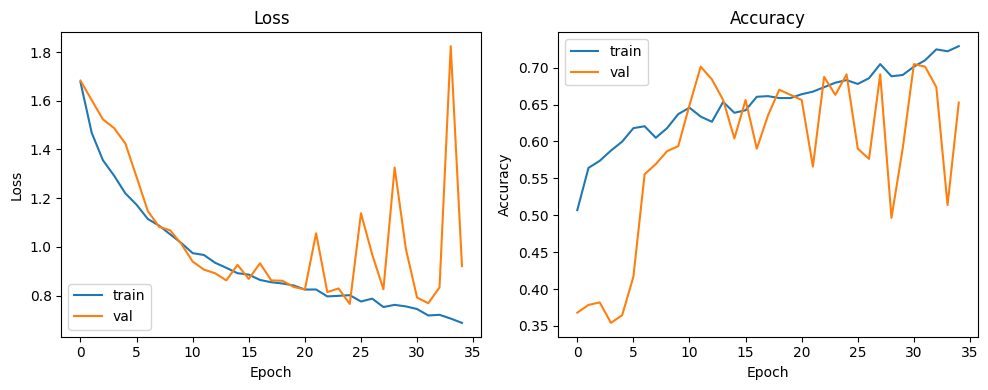

Test accuracy: 0.694


In [70]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

es = EarlyStopping(monitor="val_loss", patience=10,
                   restore_best_weights=True, verbose=1)

rlrop = ReduceLROnPlateau(monitor="val_loss", factor=0.5,
                          patience=5, min_lr=1e-6, verbose=1)
# Entraînement
epochs = 40
batch_size = 32
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[es, rlrop],
    verbose=1
)

# Courbes loss/accuracy
plot_history_simple(history)

# Évaluation sur X_test
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
print("Test accuracy:", round(test_acc, 3))

In [71]:
#hmmmmmmm

# Conclusion

Le modèle ,même amélioré, reste limité par la taille du dataset.

### Fonction build model  

In [10]:
def build_model(name) :
    if name == "baseline":
        input = Input(shape=(image_size, image_size, 3), name="Input_layer")
        x = Conv2D(32, (3, 3), activation="relu", name="Conv2D_1")(input)
        x = MaxPooling2D((2, 2), name="MaxPool2D_1")(x)
        x = Flatten(name="Flatten")(x)
        x = Dense(64, activation="relu", name="dense_1")(x)
        out = Dense(3, activation="softmax", name="Output_Layer")(x)
        model = Model(inputs=input, outputs=out, name="Baseline_CNN")
        model.compile(optimizer=Adam(learning_rate=0.001),
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        
    elif name == "deeper_CNN":
        input = Input(shape=(image_size, image_size, 3), name="Input_layer")
        x = Conv2D(32, (3, 3), activation="relu", padding="same", name="Conv2D_1")(input)
        x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_1")(x)
        x = Conv2D(64, (3, 3), activation="relu", padding="same", name="Conv2D_2")(x)
        x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_2")(x)
        x = Flatten(name="Flatten")(x)
        x = Dense(64, activation="relu", kernel_regularizer=regularizers.l2(0.01), name="dense_1")(x)
        x = Dropout(0.3)(x)
        output = Dense(3, activation="softmax", name="Output_Layer")(x)
        model = Model(inputs=input, outputs=output, name="Deeper_CNN")
        opt = SGD(learning_rate=0.001, momentum=0.9)
        model.compile(optimizer=opt,
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        
    elif name == "improved_CNN":
        input = Input(shape=(image_size, image_size, 3), name="Input_layer")
        x = Conv2D(32, (3, 3), activation="relu", padding="same", name="Conv2D_1")(input)
        x = BatchNormalization(name="BN_1")(x)
        x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_1")(x)
        x = Conv2D(64, (3, 3), activation="relu", padding="same", name="Conv2D_2")(x)
        x = BatchNormalization(name="BN_2")(x)
        x = MaxPooling2D(pool_size=(2, 2), name="MaxPool2D_2")(x)
        x = GlobalAveragePooling2D(name="GAP")(x)
        x = Dense(64, activation="relu", kernel_regularizer=regularizers.l2(0.01), name="dense_1")(x)
        x = Dropout(0.3)(x)
        output = Dense(3, activation="softmax", name="Output_Layer")(x)
        model = Model(inputs=input, outputs=output, name="Improved_CNN")
        opt = SGD(learning_rate=0.001, momentum=0.9)
        model.compile(optimizer=opt,
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
    else :
        raise ValueError(f"Unknown model name '{name}'. Choose: baseline | deeper_CNN | improved_CNN")
    
    return model

def train_cnn_model(model, train_generator, val_data, model_path,
                    epochs=10, patience=3):
    """
    Entraîne un modèle CNN avec un générateur de données et des callbacks.

    Args:
        model: Modèle CNN à entraîner.
        train_generator: Générateur d’images pour l'entraînement.
        val_data: Données de validation (X_test, y_test).
        model_path (str): Chemin de sauvegarde du modèle.
        epochs (int): Nombre d’époques d'entraînement.
        patience (int): Patience pour l'arrêt anticipé.

    Returns:
        Modèle entraîné avec les meilleurs poids restaurés.
    """
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=patience,
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint(model_path, monitor='val_loss',
                        save_best_only=True, verbose=1)
    ]

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_data,
        callbacks=callbacks,
        verbose=1
    )

    return model, history

# Augmentation de Données via ImageDataGenerator

In [11]:
tf.keras.preprocessing.image.ImageDataGenerator(
featurewise_center=False, # Centrer les données globalement
samplewise_center=False, # Centrer chaque échantillon
featurewise_std_normalization=False, # Normaliser globalement
samplewise_std_normalization=False, # Normaliser chaque échantillon
zca_whitening=False, # Blanchiment ZCA
zca_epsilon=1e-06, # Epsilon pour ZCA
rotation_range=0, # Rotations aléatoires
width_shift_range=0.0, # Décalages horizontaux
height_shift_range=0.0, # Décalages verticaux
brightness_range=None, # Ajustement de luminosité
shear_range=0.0, # Cisaillement
zoom_range=0.0, # Zoom
channel_shift_range=0.0, # Décalage de canaux
fill_mode='nearest', # Remplissage
cval=0.0, # Valeur de remplissage
horizontal_flip=False, # Flip horizontal
vertical_flip=False, # Flip vertical
rescale=None, # Mise à l'échelle
preprocessing_function=None, # Fonction de prétraitement
data_format=None, # Format d'image
validation_split=0.0, # Fraction pour validation
dtype=None # Type de données
)

In [8]:
my_path = "Data_Project/images/"          
my_classes = ['elephant', 'cat', 'sheep']  

X, y = create_X_y(my_path, my_classes)

## Découverte et Test de ImageDataGenerator

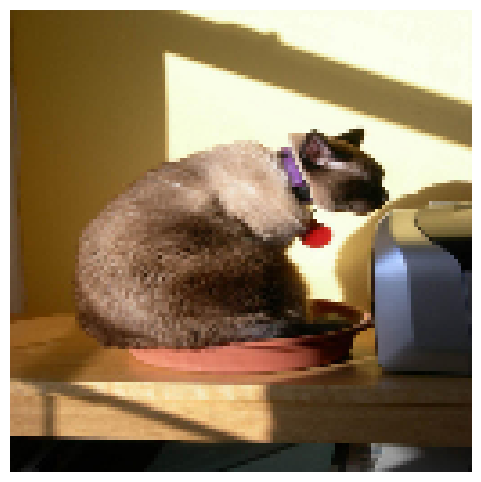

In [94]:
idx=10
img = X[idx]

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

### Flip horizontal et vertical

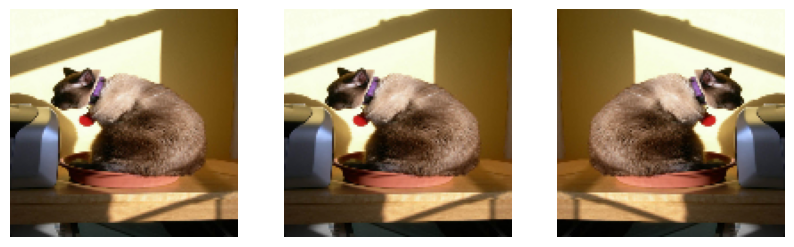

In [95]:
img_batch = np.expand_dims(img, axis=0)

datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
pic = datagen.flow(img_batch, batch_size=1)

plt.figure(figsize=(10,8))

for i in range(1,4):
    plt.subplot(1, 3, i)
    batch = next(pic) #next génère une image augmentée
    image_ = batch[0].astype('uint8')

    plt.imshow(cv2.cvtColor(image_, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.show()

### Décalage

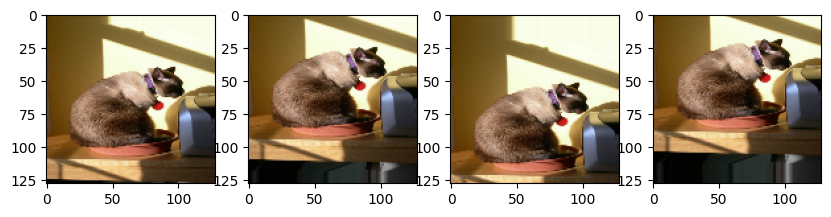

In [96]:
datagen = ImageDataGenerator(width_shift_range= 20)
pic = datagen.flow(img_batch, batch_size=1)

plt.figure(figsize=(10,8))

for i in range(1,5):
    plt.subplot(1, 4, i)
    batch = next(pic)
    image_ = batch[0].astype('uint8')
    plt.imshow(cv2.cvtColor(image_, cv2.COLOR_BGR2RGB))

plt.show()

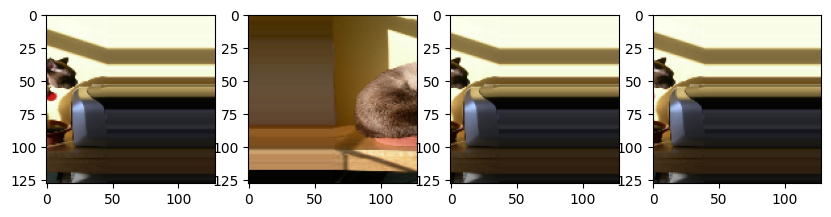

In [97]:
datagen = ImageDataGenerator(height_shift_range= 120)
pic = datagen.flow(img_batch, batch_size=1)

plt.figure(figsize=(10,8))

for i in range(1,5):
    plt.subplot(1, 4, i)
    batch = next(pic)
    image_ = batch[0].astype('uint8')
    plt.imshow(cv2.cvtColor(image_, cv2.COLOR_BGR2RGB))

plt.show()

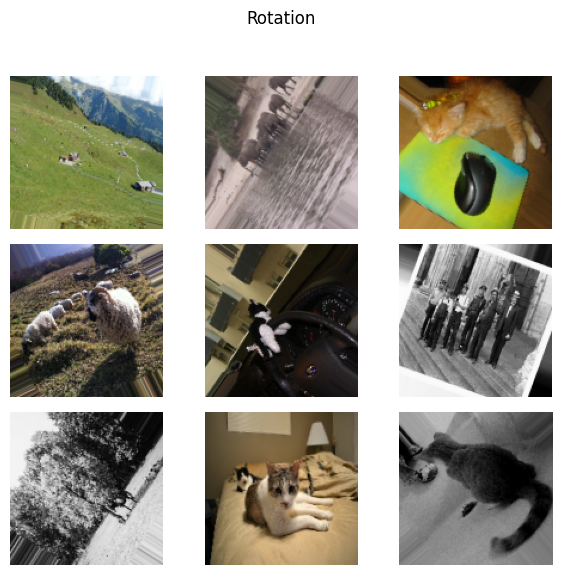

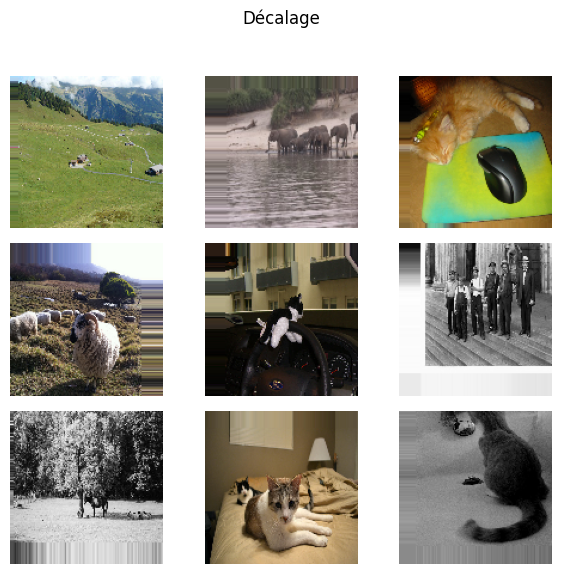

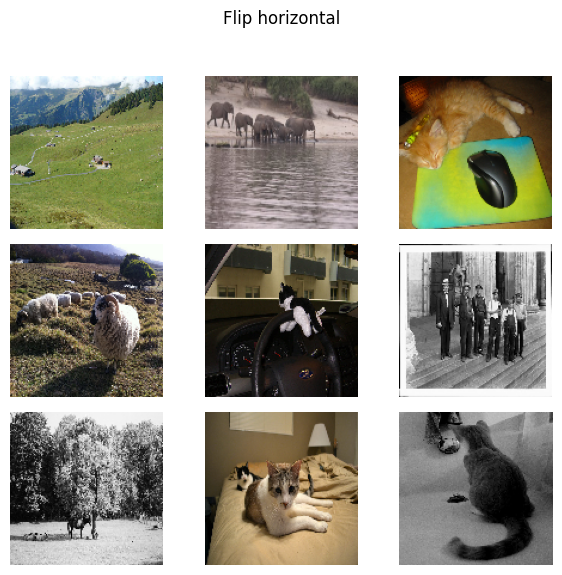

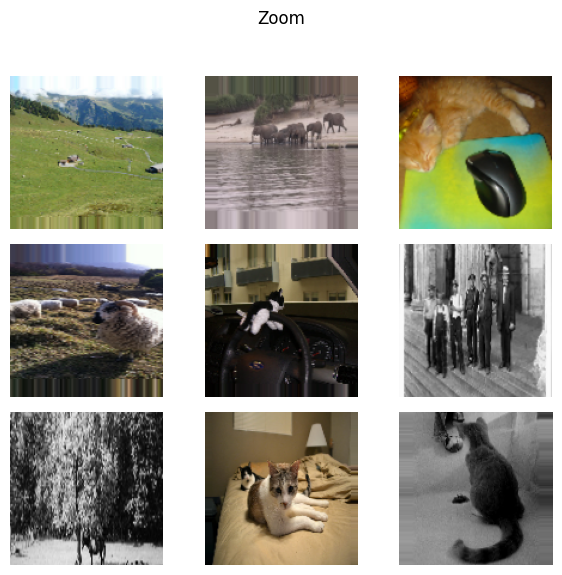

In [98]:
def plot_augmented_images(X, y, augmentation_params={},
                                title="augmented images", batch_size=9):
    """
    Fonction pour afficher des images augmentées avec les paramètres spécifiés.

    Paramètres :
    - X (array) : tableau d'images (N,H,W,C)
    - y (array, optionnel) : labels correspondants.
    - augmentation_params (dict) : paramètres pour ImageDataGenerator.
    - title (str) : Titre du subplot pour la série d'images.
    - batch_size (int) : Taille du batch à afficher.
    """
    batch_size = min(batch_size, len(X), 9)
    X_sample = X[:batch_size] 
    y_sample = y[:batch_size] if y is not None else None
    
    datagen = ImageDataGenerator(**augmentation_params)

    gen = datagen.flow(X_sample, y_sample, batch_size=batch_size, shuffle=False)
    X_batch, y_batch = next(gen) 

    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(6,6))
    fig.suptitle(title, fontsize=12)

    for i in range(batch_size):
        img_aug = X_batch[i].astype('uint8')
            
        if img_aug.shape[2] == 3:
            img_aug = cv2.cvtColor(img_aug, cv2.COLOR_BGR2RGB)

        row, col = divmod(i, 3)
        ax[row, col].imshow(img_aug)
        ax[row, col].axis('off')

        # label si fourni
        if y_sample is not None:
            ax[row, col].set_xlabel(str(y_sample[i]))

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Rotation
plot_augmented_images(X, y, {'rotation_range': 80}, title='Rotation')

# Décalage
plot_augmented_images(X, y, {'width_shift_range': 20, 'height_shift_range': 20},
                            title='Décalage')

# Flip horizontal
plot_augmented_images(X, y, {'horizontal_flip': True}, title='Flip horizontal')

# Zoom
plot_augmented_images(X, y, {'zoom_range': 0.4}, title='Zoom')

## Essai avec ImageDataGenerator

In [22]:
image_size=128
X = X.astype("float32") / 255.0
X=X.astype('float')

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [17]:
print("X_train range:", X_train.min(), X_train.max())
print("X_train dtype:", X_train.dtype)
print("X_train shape:", X_train.shape)
print("y_train unique:", np.unique(y_train))
print("y_train sample:", y_train[:5])

X_train range: 0.0 255.0
X_train dtype: float64
X_train shape: (1440, 128, 128, 3)
y_train unique: [0 1 2]
y_train sample: [2 2 1 0 2]


Epoch 1/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.3790 - loss: 2.3811
Epoch 1: val_loss improved from None to 0.95958, saving model to best_baseline_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.4486 - loss: 1.5521 - val_accuracy: 0.5278 - val_loss: 0.9596
Epoch 2/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.6180 - loss: 0.8957
Epoch 2: val_loss improved from 0.95958 to 0.83315, saving model to best_baseline_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.6299 - loss: 0.8620 - val_accuracy: 0.6694 - val_loss: 0.8332
Epoch 3/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.6947 - loss: 0.7503
Epoch 3: val_loss did not improve from 0.83315
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6889 - loss: 0.7497 - val_accuracy: 0.6250 - val_loss: 0.8879
Epoch 4/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.7081 - loss: 0.7215
Epoch 4: val_loss improved from 0.83315 to 0.80119, saving model to best_baseline_

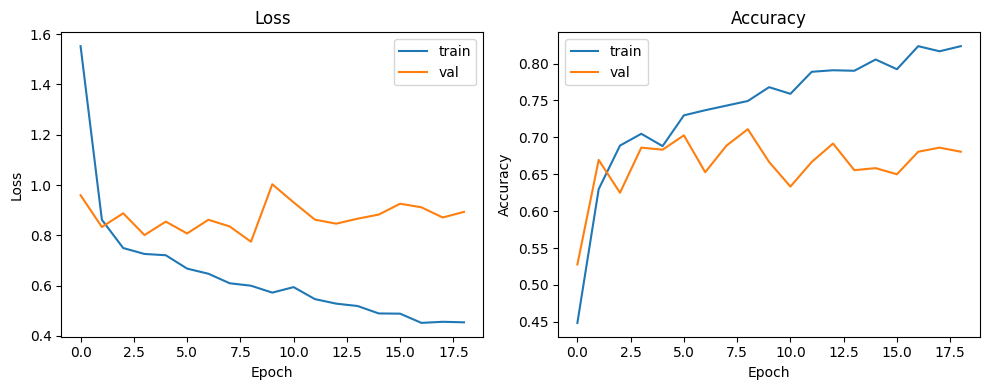

Baseline Test accuracy: 0.711


In [28]:
model_baseline = build_model("baseline")

datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

model_baseline, history_baseline = train_cnn_model(
    model_baseline,
    train_generator=train_generator,
    val_data=(X_test, y_test),
    model_path="best_baseline_aug.keras",
    epochs=40,
    patience=10
)
plot_history_simple(history_baseline)
_, acc_baseline = model_baseline.evaluate(X_test, y_test, verbose=0)
print("Baseline Test accuracy:", round(acc_baseline, 3))

Epoch 1/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.3960 - loss: 2.3669
Epoch 1: val_loss improved from None to 2.30561, saving model to best_deeper_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - accuracy: 0.4062 - loss: 2.3517 - val_accuracy: 0.4778 - val_loss: 2.3056
Epoch 2/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.4628 - loss: 2.2959
Epoch 2: val_loss improved from 2.30561 to 2.26886, saving model to best_deeper_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - accuracy: 0.4569 - loss: 2.2848 - val_accuracy: 0.4417 - val_loss: 2.2689
Epoch 3/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.4786 - loss: 2.2533
Epoch 3: val_loss improved from 2.26886 to 2.22642, saving model to best_deeper_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.4868 - loss: 2.2437 - val_accuracy: 0.5111 - val_loss: 2.2264
Epoch 4/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.5100 - loss: 2.2047
Epoch 4: val_loss improved from 2.2264

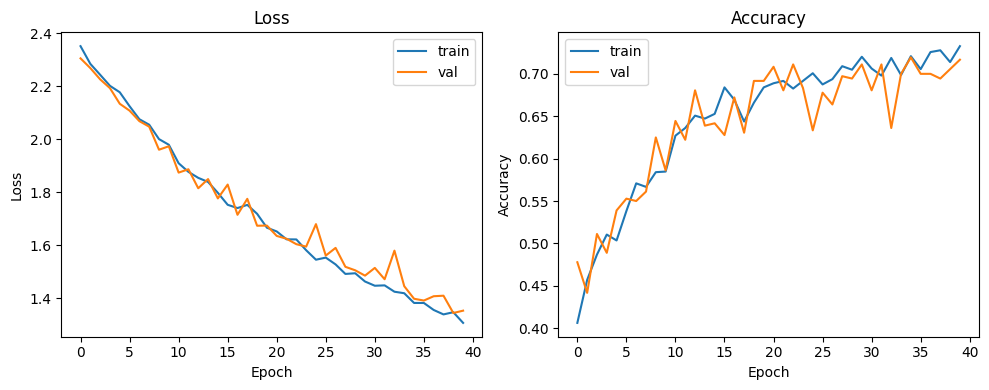

Deeper CNN Test accuracy: 0.706


In [29]:
model_deeper = build_model("deeper_CNN")

datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

model_deeper, history_deeper = train_cnn_model(
    model_deeper,
    train_generator=train_generator,
    val_data=(X_test, y_test),
    model_path="best_deeper_aug.keras",
    epochs=40,
    patience=15
)
plot_history_simple(history_deeper)
_, acc_deeper = model_deeper.evaluate(X_test, y_test, verbose=0)
print("Deeper CNN Test accuracy:", round(acc_deeper, 3))

Epoch 1/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.3927 - loss: 1.7605
Epoch 1: val_loss improved from None to 1.72330, saving model to best_improved_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 208ms/step - accuracy: 0.4660 - loss: 1.6873 - val_accuracy: 0.3806 - val_loss: 1.7233
Epoch 2/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.5538 - loss: 1.5815
Epoch 2: val_loss improved from 1.72330 to 1.70542, saving model to best_improved_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.5639 - loss: 1.5616 - val_accuracy: 0.4583 - val_loss: 1.7054
Epoch 3/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5709 - loss: 1.5228
Epoch 3: val_loss improved from 1.70542 to 1.69994, saving model to best_improved_aug.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.5785 - loss: 1.5232 - val_accuracy: 0.3389 - val_loss: 1.6999
Epoch 4/40
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.6131 - loss: 1.4713
Epoch 4: val_loss improved from

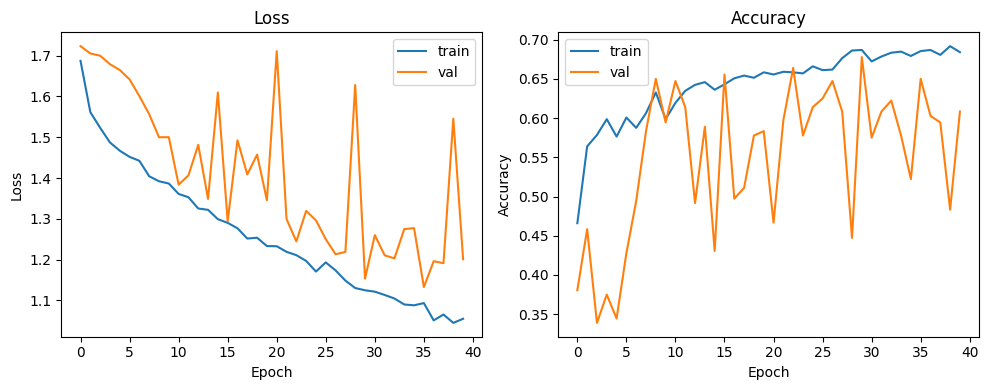

Improved CNN Test accuracy: 0.65


In [30]:
model_improved = build_model("improved_CNN")

datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

model_improved, history_improved = train_cnn_model(
    model_improved,
    train_generator=train_generator,
    val_data=(X_test, y_test),
    model_path="best_improved_aug.keras",
    epochs=40,
    patience=15
)
plot_history_simple(history_improved)
_, acc_improved = model_improved.evaluate(X_test, y_test, verbose=0)
print("Improved CNN Test accuracy:", round(acc_improved, 3))

In [31]:
print("=== RESULTS WITH AUGMENTATION ===")
print(f"Baseline   : {round(acc_baseline, 3)}")
print(f"Deeper CNN : {round(acc_deeper, 3)}")
print(f"Improved CNN: {round(acc_improved, 3)}")

=== RESULTS WITH AUGMENTATION ===
Baseline   : 0.711
Deeper CNN : 0.706
Improved CNN: 0.65


On remarque que deeper CNN montre le meilleir resultats on terme de graphes

## Dernier modele avec ImageDataGenerator  

Epoch 1/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.4551 - loss: 1.3535
Epoch 1: val_loss improved from None to 1.18350, saving model to best_model.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - accuracy: 0.5132 - loss: 1.1650 - val_accuracy: 0.3333 - val_loss: 1.1835 - learning_rate: 0.0010
Epoch 2/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.6182 - loss: 0.9946
Epoch 2: val_loss did not improve from 1.18350
45/45 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - accuracy: 0.6090 - loss: 0.9760 - val_accuracy: 0.3333 - val_loss: 1.1874 - learning_rate: 0.0010
Epoch 3/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.6167 - loss: 0.9352
Epoch 3: val_loss improved from 1.18350 to 1.16917, saving model to best_model.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - accuracy: 0.6243 - loss: 0.9274 - val_accuracy: 0.3333 - val_loss: 1.1692 - learning_rate: 0.0010
Epoch 4/50
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - accuracy: 0.6298 - loss: 0.9145
Epoch 4: val_los

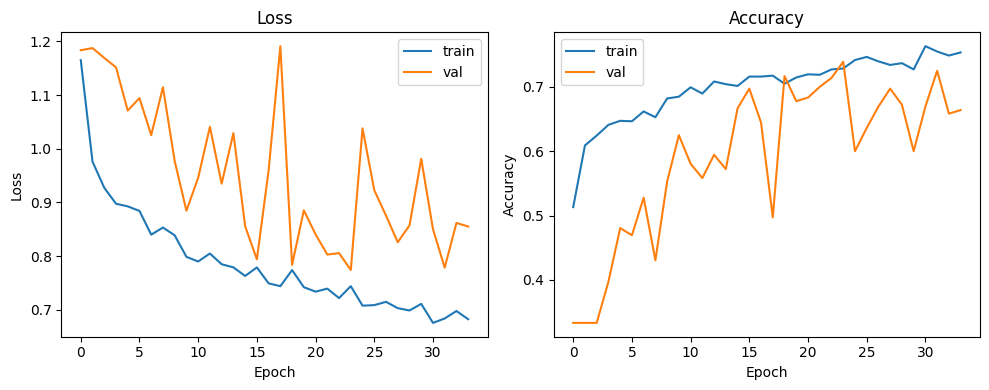

Test accuracy: 0.739
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

Classification Report:

              precision    recall  f1-score   support

    elephant       0.68      0.78      0.73       120
         cat       0.89      0.72      0.79       120
       sheep       0.69      0.72      0.70       120

    accuracy                           0.74       360
   macro avg       0.75      0.74      0.74       360
weighted avg       0.75      0.74      0.74       360



In [44]:
my_path = "Data_Project/images/"
my_classes = ['elephant', 'cat', 'sheep']

X, y = create_X_y(my_path, my_classes)

X = X.astype("float32") / 255.0
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)

train_generator = datagen.flow(
    X_train, y_train,
    batch_size=32,
    shuffle=True
)


def build_final_model(image_size):
    input = Input(shape=(image_size, image_size, 3), name="Input_layer")

    x = Conv2D(32, (3, 3), activation="relu", padding="same")(input)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(128, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = GlobalAveragePooling2D()(x)

    x = Dense(64, activation="relu",
              kernel_regularizer=regularizers.l2(0.001))(x)
    x = Dropout(0.3)(x)

    output = Dense(3, activation="softmax")(x)

    model = Model(inputs=input, outputs=output, name="Deeper_CNN_FIXED")

    opt = SGD(learning_rate=0.001, momentum=0.9)

    model.compile(
        optimizer=opt,
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

image_size = 128
model = build_final_model(image_size)

callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        "best_model.keras",
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-5,
        verbose=1
    )
]

history = model.fit(
    train_generator,
    epochs=50,
    validation_data=(X_test, y_test),
    callbacks=callbacks,
    verbose=1
)

plot_history_simple(history)

loss, acc = model.evaluate(X_test, y_test, verbose=0)
print("Test accuracy:", round(acc, 3))


y_pred = np.argmax(model.predict(X_test), axis=1)

print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, target_names=my_classes))

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step


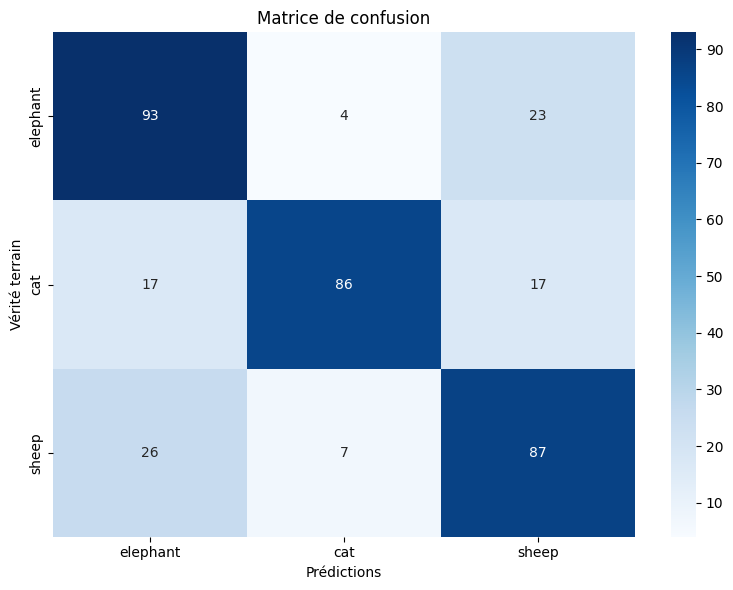

In [45]:
y_pred_labels = np.argmax(model.predict(X_test), axis=1)

conf = confusion_matrix(y_test, y_pred_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
            xticklabels=my_classes, yticklabels=my_classes)
plt.title('Matrice de confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vérité terrain')
plt.tight_layout()
plt.show()

## Feature Maps

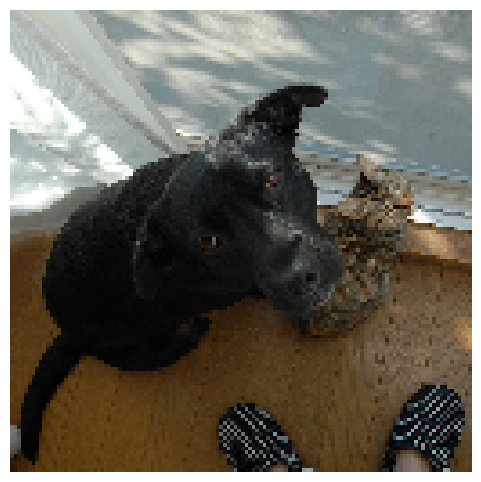

In [54]:
idx=23
img = X[idx]

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

In [55]:
for layer in model.layers:
    print(layer.name, layer.output.shape)

Input_layer (None, 128, 128, 3)
conv2d_18 (None, 128, 128, 32)
batch_normalization_6 (None, 128, 128, 32)
max_pooling2d_18 (None, 64, 64, 32)
conv2d_19 (None, 64, 64, 64)
batch_normalization_7 (None, 64, 64, 64)
max_pooling2d_19 (None, 32, 32, 64)
conv2d_20 (None, 32, 32, 128)
batch_normalization_8 (None, 32, 32, 128)
max_pooling2d_20 (None, 16, 16, 128)
global_average_pooling2d_6 (None, 128)
dense_12 (None, 64)
dropout_12 (None, 64)
dense_13 (None, 3)


Couches Conv détectées : ['conv2d_18', 'conv2d_19', 'conv2d_20']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

conv2d_18's shape : (1, 128, 128, 32)


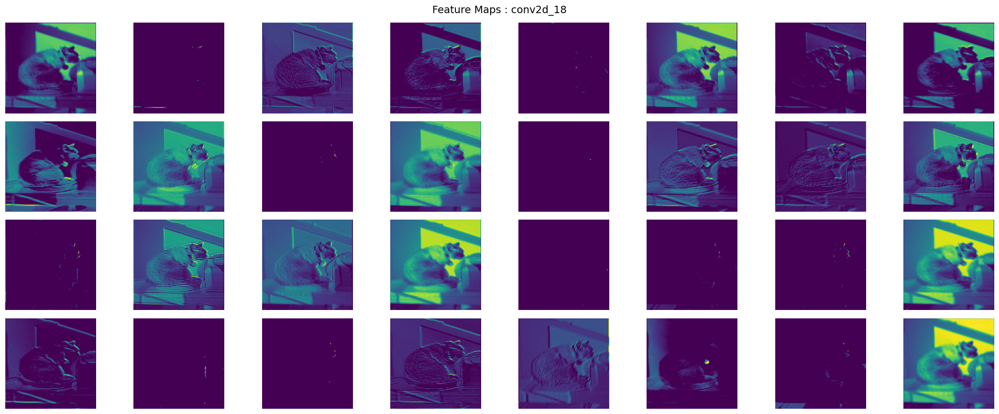


conv2d_19's shape : (1, 64, 64, 64)


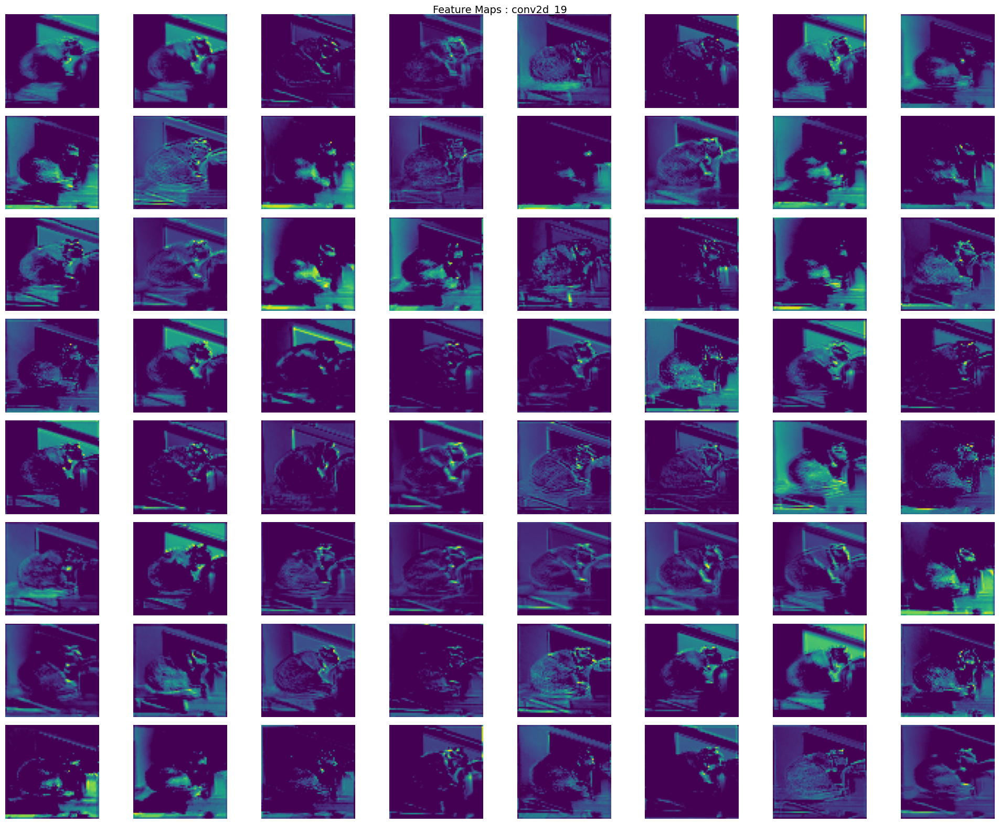


conv2d_20's shape : (1, 32, 32, 128)


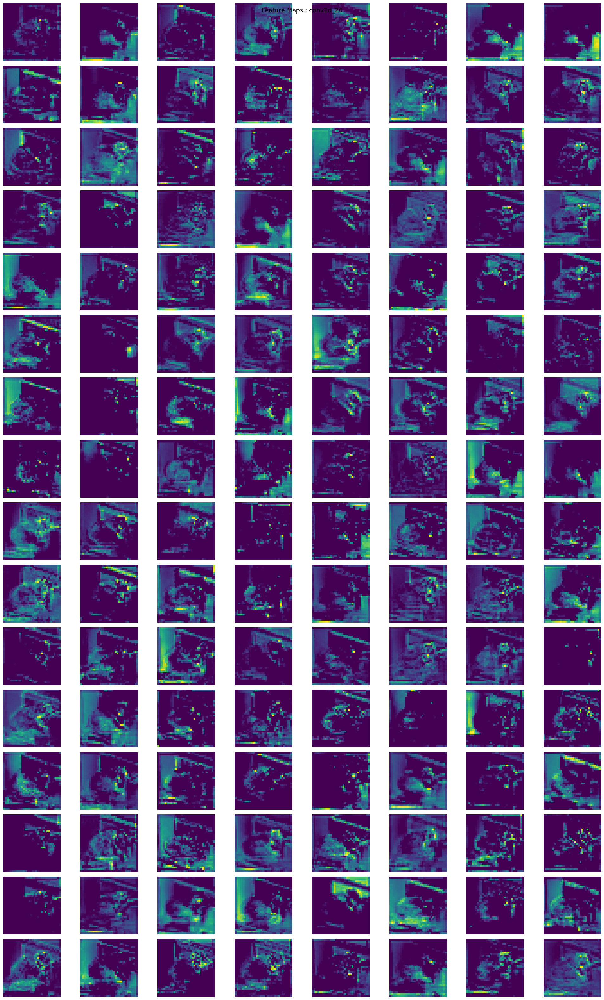

In [56]:
list_layer_conv = [l.name for l in model.layers if 'conv2d' in l.name]
print("Couches Conv détectées :", list_layer_conv)

outputs = [model.get_layer(name).output for name in list_layer_conv]
feature_maps_model = tf.keras.models.Model(inputs=model.input, outputs=outputs)
feature_maps = feature_maps_model.predict(my_image)

for layer_name, fmap in zip(list_layer_conv, feature_maps):
    print(f"\n{layer_name}'s shape : {fmap.shape}")
    
    num_maps = fmap.shape[-1] 
    cols = 8
    rows = (num_maps // cols) + (num_maps % cols > 0)
    
    fig = plt.figure(figsize=(20, rows * 2))
    fig.suptitle(f"Feature Maps : {layer_name}", fontsize=14)
    
    for j in range(num_maps):
        plt.subplot(rows, cols, j + 1)
        plt.imshow(fmap[0, :, :, j], cmap='viridis')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Transfer Learning

In [19]:
def transfer_model(image_size=128, num_classes=3):
    inputs = Input(shape=(image_size, image_size, 3), name="Input_Layer")
    
    x = preprocess_input(inputs * 255.0)
    
    base_model = ResNet50(
        include_top=False,
        pooling='avg',
        weights='imagenet',
        input_shape=(image_size, image_size, 3)
    )
    base_model.trainable = False
    
    x = base_model(x)
    x = Dense(512, activation='relu', name="Dense1_Layer")(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax', name="Output_Layer")(x)
    
    model = Model(inputs=inputs, outputs=outputs, name="ResNet50_Transfer")
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [20]:
transfer_model().summary()

Model: "ResNet50_Transfer"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_Layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 128, 128,  │          0 │ Input_Layer[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 128, 128)  │          0 │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 128, 128)  │          0 │ multiply[0][0]    │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 128, 128)  │          0 │ multiply[0][0]    │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 128, 128,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense1_Layer        │ (None, 512)       │  1,049,088 │ resnet50[0][0]    │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 512)       │          0 │ Dense1_Layer[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Output_Layer        │ (None, 3)         │      1,539 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 24,638,339 (93.99 MB)

 Trainable params: 1,050,627 (4.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [21]:
my_path = "Data_Project/images/"
my_classes = ['elephant', 'cat', 'sheep']

X, y = create_X_y(my_path, my_classes)

X = X.astype("float32") / 255.0
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

Epoch 1/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.6342 - loss: 2.3228
Epoch 1: val_loss improved from None to 0.36351, saving model to best_transfer.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 335ms/step - accuracy: 0.7528 - loss: 1.1403 - val_accuracy: 0.8528 - val_loss: 0.3635
Epoch 2/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.8447 - loss: 0.3428
Epoch 2: val_loss did not improve from 0.36351
45/45 ━━━━━━━━━━━━━━━━━━━━ 14s 309ms/step - accuracy: 0.8611 - loss: 0.3338 - val_accuracy: 0.8583 - val_loss: 0.4111
Epoch 3/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.8858 - loss: 0.2953
Epoch 3: val_loss improved from 0.36351 to 0.29598, saving model to best_transfer.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 15s 333ms/step - accuracy: 0.8861 - loss: 0.2881 - val_accuracy: 0.8694 - val_loss: 0.2960
Epoch 4/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9060 - loss: 0.2381
Epoch 4: val_loss did not improve from 0.29598
45/45 ━━━━━━━━━━━━━━━━━━━━ 15s 334m

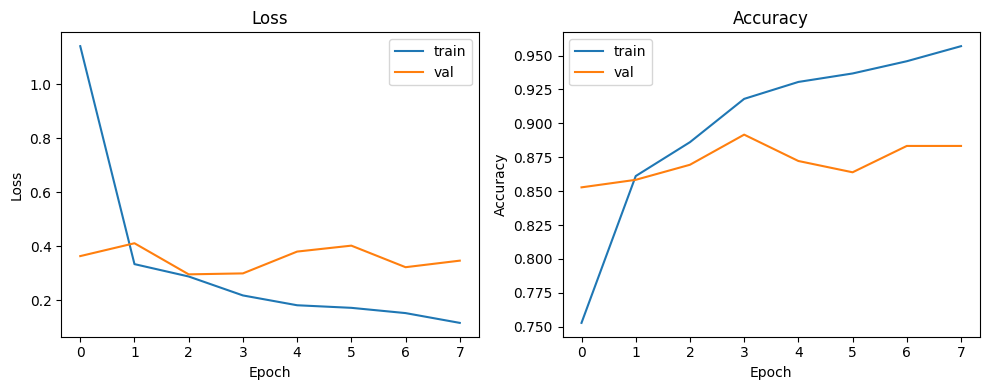

Transfer Learning Test accuracy: 0.869


In [22]:
datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

model_transfer, history_transfer = train_cnn_model(
    transfer_model(),
    train_generator=train_generator,
    val_data=(X_test, y_test),
    model_path="best_transfer.keras",
    epochs=20,       
    patience=5
)
plot_history_simple(history_transfer)
_, acc_transfer = model_transfer.evaluate(X_test, y_test, verbose=0)
print("Transfer Learning Test accuracy:", round(acc_transfer, 3))

12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 341ms/step
              precision    recall  f1-score   support

    elephant       0.84      0.91      0.87       120
         cat       0.94      0.86      0.90       120
       sheep       0.83      0.84      0.84       120

    accuracy                           0.87       360
   macro avg       0.87      0.87      0.87       360
weighted avg       0.87      0.87      0.87       360



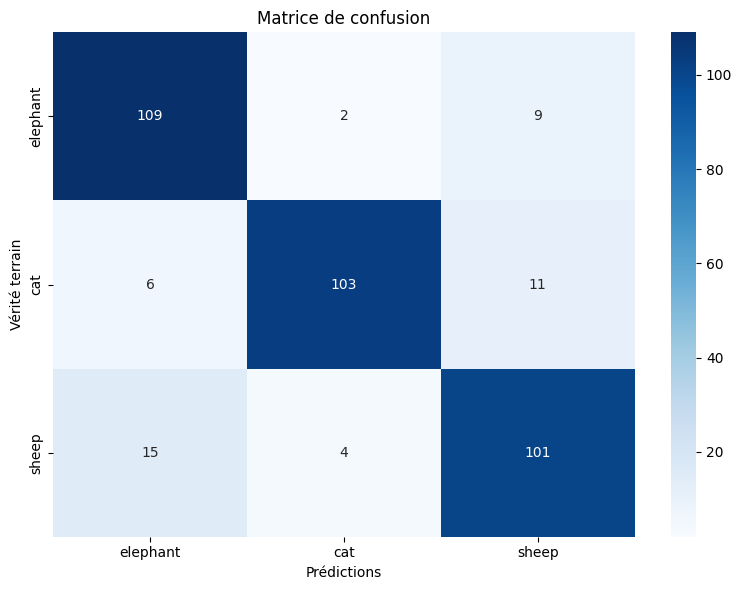

Transfer Learning : 0.869


In [23]:
y_pred = np.argmax(model_transfer.predict(X_test), axis=1)
print(classification_report(y_test, y_pred, target_names=my_classes))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d',
            cmap='Blues', xticklabels=my_classes, yticklabels=my_classes)
plt.title("Matrice de confusion")
plt.xlabel("Prédictions")
plt.ylabel("Vérité terrain")
plt.tight_layout()
plt.show()

print(f"Transfer Learning : {round(acc_transfer, 3)}")

# Bismillah we'll unfreeze the other layers

In [32]:
def final_transfer_model(image_size=128, num_classes=3):
    inputs = Input(shape=(image_size, image_size, 3), name="Input_Layer")
    
    x = preprocess_input(inputs * 255.0)
    
    base_model = ResNet50(
        include_top=False,
        pooling='avg',
        weights='imagenet',
        input_shape=(image_size, image_size, 3)
    )
    base_model.trainable = True
    
    x = base_model(x)
    x = Dense(512, activation='relu', name="Dense1_Layer")(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax', name="Output_Layer")(x)
    
    model = Model(inputs=inputs, outputs=outputs, name="ResNet50_Finetuned")
    model.compile(optimizer=Adam(learning_rate=1e-5),  # very small lr — critical
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [33]:
model= final_transfer_model()
model.summary()

Model: "ResNet50_Finetuned"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_Layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_6          │ (None, 128, 128,  │          0 │ Input_Layer[0][0] │
│ (Multiply)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_18         │ (None, 128, 128)  │          0 │ multiply_6[0][0]  │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_19         │ (None, 128, 128)  │          0 │ multiply_6[0][0]  │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_20         │ (None, 128, 128)  │          0 │ multiply_6[0][0]  │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack_6 (Stack)     │ (None, 128, 128,  │          0 │ get_item_18[0][0… │
│                     │ 3)                │            │ get_item_19[0][0… │
│                     │                   │            │ get_item_20[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 128, 128,  │          0 │ stack_6[0][0]     │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ add_6[0][0]       │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense1_Layer        │ (None, 512)       │  1,049,088 │ resnet50[0][0]    │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 512)       │          0 │ Dense1_Layer[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Output_Layer        │ (None, 3)         │      1,539 │ dropout_6[0][0]   │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 24,638,339 (93.99 MB)

 Trainable params: 24,585,219 (93.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [34]:
my_path = "Data_Project/images/"
my_classes = ['elephant', 'cat', 'sheep']

X, y = create_X_y(my_path, my_classes)

X = X.astype("float32") / 255.0
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

Epoch 1/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6492 - loss: 2.1989
Epoch 1: val_loss improved from None to 0.39857, saving model to best_best_transfer.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 382ms/step - accuracy: 0.7444 - loss: 1.1978 - val_accuracy: 0.8639 - val_loss: 0.3986
Epoch 2/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.8638 - loss: 0.3083
Epoch 2: val_loss improved from 0.39857 to 0.28782, saving model to best_best_transfer.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 17s 368ms/step - accuracy: 0.8687 - loss: 0.3037 - val_accuracy: 0.9056 - val_loss: 0.2878
Epoch 3/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.8861 - loss: 0.2915
Epoch 3: val_loss did not improve from 0.28782
45/45 ━━━━━━━━━━━━━━━━━━━━ 16s 364ms/step - accuracy: 0.8986 - loss: 0.2582 - val_accuracy: 0.9028 - val_loss: 0.3036
Epoch 4/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - accuracy: 0.9207 - loss: 0.2010
Epoch 4: val_loss did not improve from 0.28782
45/45 ━━━━━━━━━━━━━━━━━━━

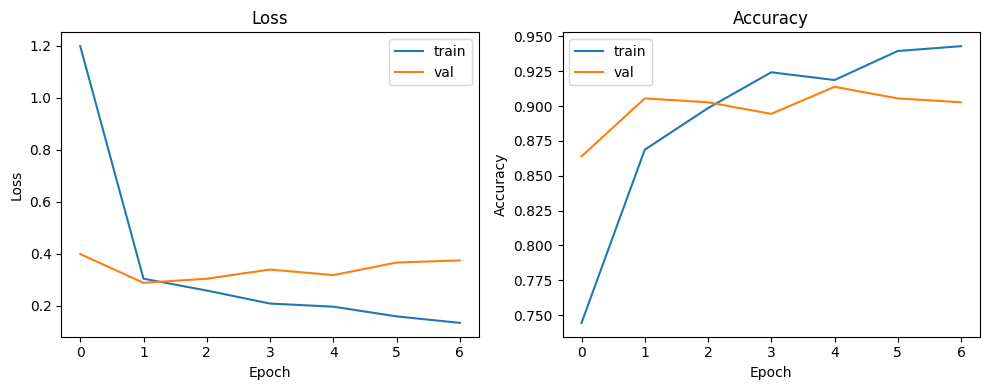

Transfer Learning Test accuracy: 0.906


In [35]:
datagen = ImageDataGenerator(
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True
)
train_generator = datagen.flow(X_train, y_train, batch_size=32, shuffle=True)

model_transfer, history_transfer = train_cnn_model(
    transfer_model(),
    train_generator=train_generator,
    val_data=(X_test, y_test),
    model_path="best_best_transfer.keras",
    epochs=20,     
    patience=5
)
plot_history_simple(history_transfer)
_, acc_transfer = model_transfer.evaluate(X_test, y_test, verbose=0)
print("Transfer Learning Test accuracy:", round(acc_transfer, 3))

12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 374ms/step
              precision    recall  f1-score   support

    elephant       0.92      0.92      0.92       120
         cat       0.92      0.93      0.92       120
       sheep       0.88      0.88      0.88       120

    accuracy                           0.91       360
   macro avg       0.91      0.91      0.91       360
weighted avg       0.91      0.91      0.91       360



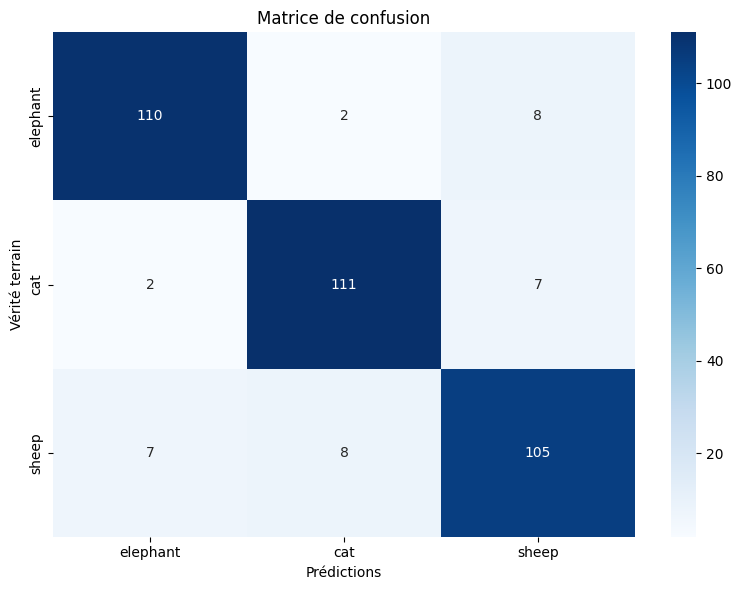

Transfer Learning : 0.906


In [36]:
y_pred = np.argmax(model_transfer.predict(X_test), axis=1)
print(classification_report(y_test, y_pred, target_names=my_classes))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d',
            cmap='Blues', xticklabels=my_classes, yticklabels=my_classes)
plt.title("Matrice de confusion")
plt.xlabel("Prédictions")
plt.ylabel("Vérité terrain")
plt.tight_layout()
plt.show()

print(f"Transfer Learning : {round(acc_transfer, 3)}")